In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments


Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1392, done.
remote: Counting objects: 100% (165/165), done.
remote: Compressing objects: 100% (112/112), done.
remote: Total 1392 (delta 109), reused 102 (delta 53), pack-reused 1227
Receiving objects: 100% (1392/1392), 57.48 MiB | 17.17 MiB/s, done.
Resolving deltas: 100% (993/993), done.


In [ ]:
import torch
torch.backends.cudnn.benchmark = True

In [ ]:

from PFNExperiments.LinearRegression.GenerativeModels.GenerateData import GenerateData, check_data, check_and_plot_data
from PFNExperiments.LinearRegression.GenerativeModels.GenerateData_LogReg import make_logreg_program_ig_batched, make_logreg_program_ig

from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform
from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.LinearRegression.GenerativeModels.Quantizer import Quantizer
from PFNExperiments.LinearRegression.Models.Transformer_CNF import TransformerCNFConditionalDecoder
from PFNExperiments.Training.Trainer import Trainer, batch_to_model_lm, visualize_training_results
from PFNExperiments.Training.Losses import MSELoss_unsqueezed, nll_loss_full_gaussian
from PFNExperiments.Training.EvalMetrics import mean_squared_error_torch_avg, mae_torch_avg, r2_score_torch_avg
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian, ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.AugmentLoss import add_l2_loss_nll_loss
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist

from PFNExperiments.Training.FlowMatching.CFMLossOT2 import CFMLossOT2

from PFNExperiments.Evaluation.ComparePosteriorSamples import compare_all_metrics, marginal_plots_hist_parallel, marginal_plots_kde_together
from PFNExperiments.LinearRegression.Evaluation.CompareModels import ModelComparison
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF import ModelToPosteriorCNF
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC

from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference, make_guide_program_gamma_gamma

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM

from PFNExperiments.Training.TrainerCurriculumCNF import TrainerCurriculumCNF

from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig
from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels

from PFNExperiments.Training.FlowMatching.Couplings import MiniBatchOTCoupling

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured
from PFNExperiments.Evaluation.Evaluate import Evaluate


from PFNExperiments.LinearRegression.GenerativeModels.GenerateX import simulate_X_uniform_discretized3

In [ ]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InvGammaLaplacePrior_FM_v3"

#BATCH_SIZE = 128

In [ ]:
a = 5.0
b = 2.0
tau = 0.5

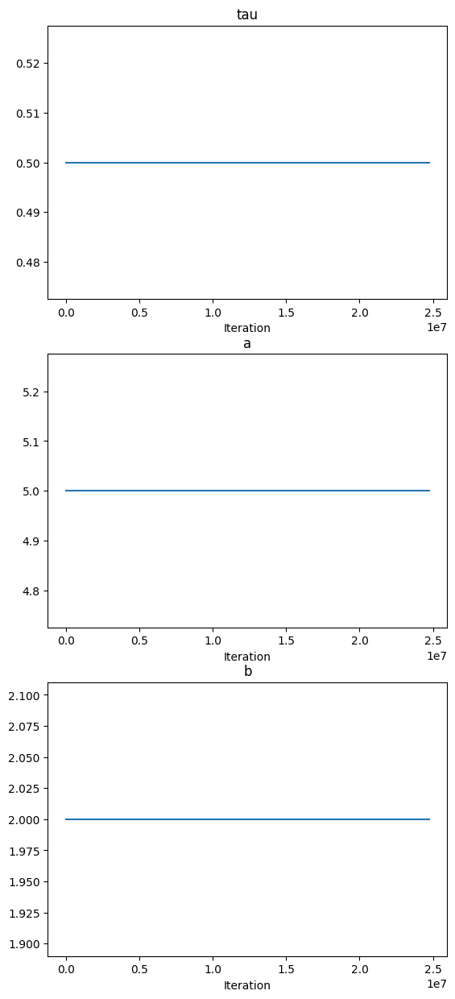

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 0.5, 'a': 5.0, 'b': 2.0}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_logreg_program_ig_batched,
    curriculum= curriculum,
    #pprogram_covariates = simulate_X_uniform_discretized3
)

In [ ]:
next(iter(data_generator.make_dataloaders_for_epoch_dynamic()[0])).keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'time', 'base_sample_beta'])

####################################################################################################
Epoch 0


100%|██████████| 10/10 [00:00<00:00, 74.19it/s]


{'X': {'mean': tensor(0.5005), 'variance': tensor(0.0833), 'min': tensor(1.7881e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.4934), 'variance': tensor(0.2500), 'min': tensor(0.), 'max': tensor(1.)}, 'beta': {'mean': tensor([-0.0077, -0.0094, -0.0213,  0.0028, -0.0147]), 'variance': tensor([0.2427, 0.2486, 0.2445, 0.2553, 0.2363]), 'min': tensor([-1.5452, -1.9955, -1.6612, -2.0268, -1.7035]), 'max': tensor([1.7917, 2.3758, 1.8055, 1.8129, 1.5239])}}
Statistics for sigma_squared:
Mean: tensor([0.4990])
Variance: tensor([0.0760])
Min: tensor([0.1160])
Max: tensor([4.7223])


Statistics for time:
Mean: 0.4990444233641028
Variance: 0.08321212257048397
Min: 0.0008258223533630371
Max: 0.9990549087524414


Statistics for base_sample_beta:
Mean: tensor([ 0.0195,  0.0185, -0.0102,  0.0192,  0.0147])
Variance: tensor([1.0058, 0.9860, 0.9703, 0.9816, 0.9846])
Min: tensor([-3.5884, -3.6927, -3.3947, -3.4980, -3.3804])
Max: tensor([4.2395, 3.0408, 3.9889, 3.2861, 3.2991])




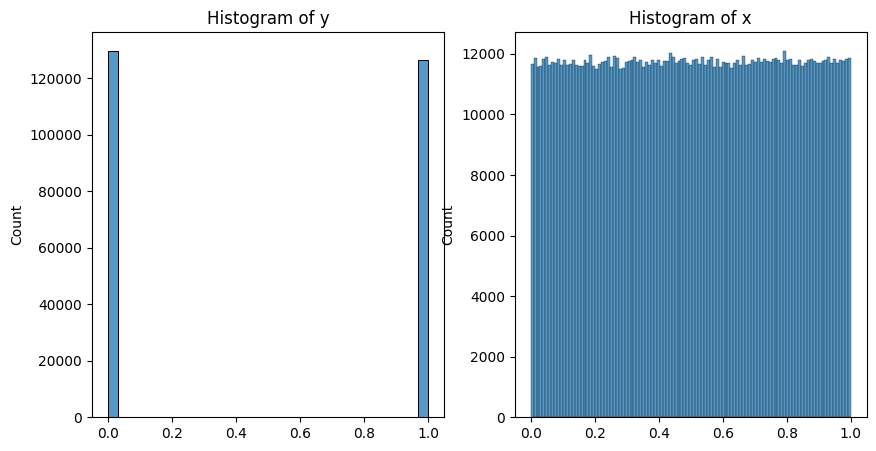

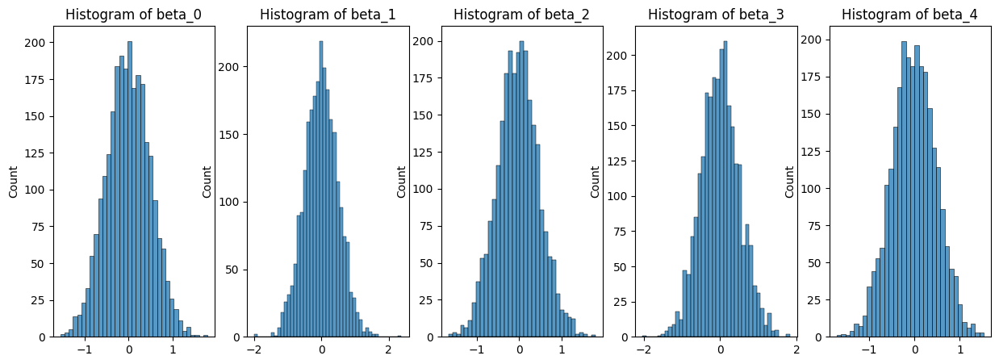

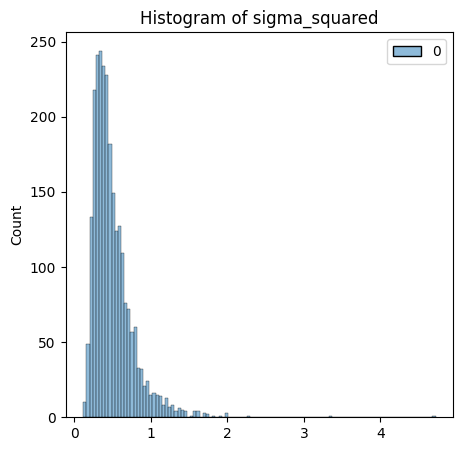

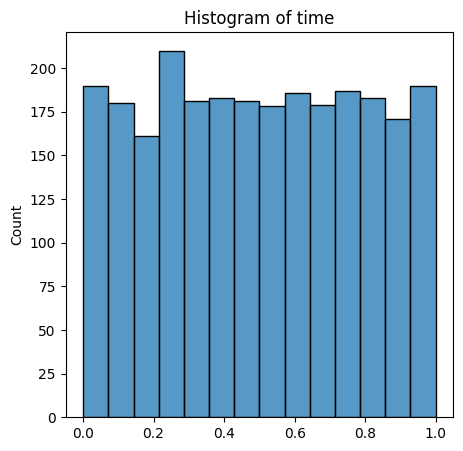

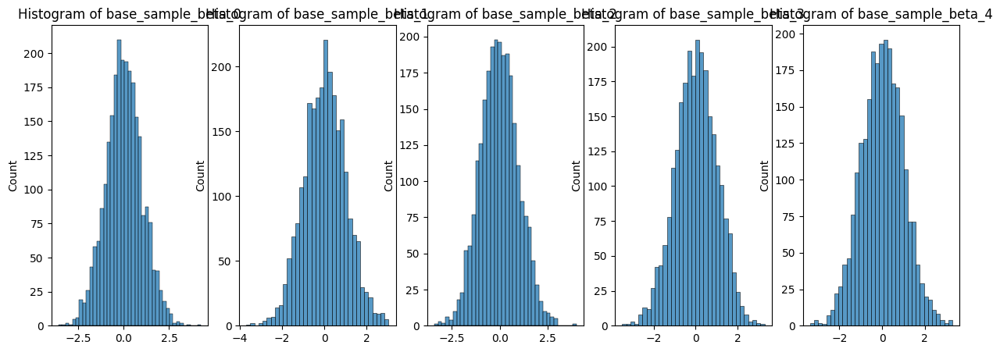

####################################################################################################
Epoch 99


100%|██████████| 10/10 [00:00<00:00, 70.86it/s]

{'X': {'mean': tensor(0.5001), 'variance': tensor(0.0833), 'min': tensor(7.1526e-07), 'max': tensor(1.0000)}, 'y': {'mean': tensor(0.4988), 'variance': tensor(0.2500), 'min': tensor(0.), 'max': tensor(1.)}, 'beta': {'mean': tensor([-0.0100, -0.0105, -0.0211,  0.0130,  0.0098]), 'variance': tensor([0.2521, 0.2506, 0.2511, 0.2443, 0.2531]), 'min': tensor([-1.5073, -1.8266, -1.6904, -1.5855, -1.8387]), 'max': tensor([1.7041, 1.8548, 1.5286, 1.6605, 1.5400])}}
Statistics for sigma_squared:
Mean: tensor([0.5045])
Variance: tensor([0.0802])
Min: tensor([0.1157])
Max: tensor([3.3769])


Statistics for time:
Mean: 0.49987869344186037
Variance: 0.08191770102549341
Min: 0.0001995563507080078
Max: 0.9996616840362549


Statistics for base_sample_beta:
Mean: tensor([ 0.0044, -0.0146,  0.0224, -0.0065, -0.0102])
Variance: tensor([0.9949, 0.9826, 1.0295, 0.9606, 1.0145])
Min: tensor([-3.6076, -3.5040, -3.2564, -3.7927, -3.5779])
Max: tensor([3.9665, 3.5911, 3.1550, 3.4307, 3.4155])




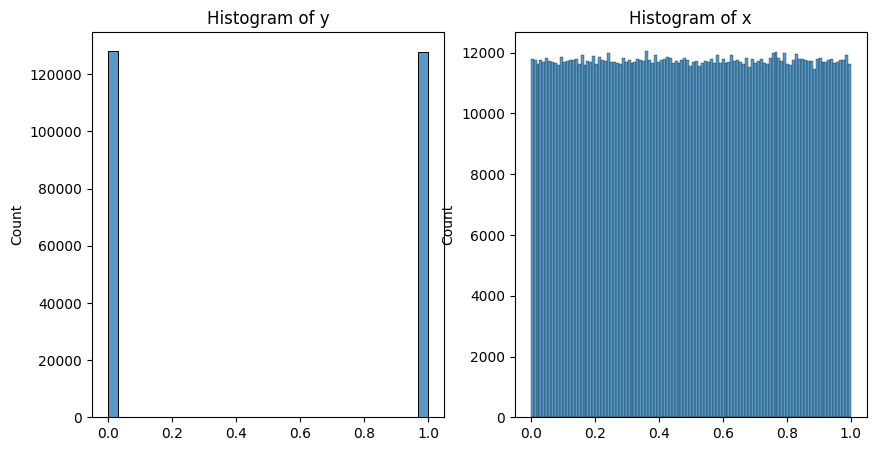

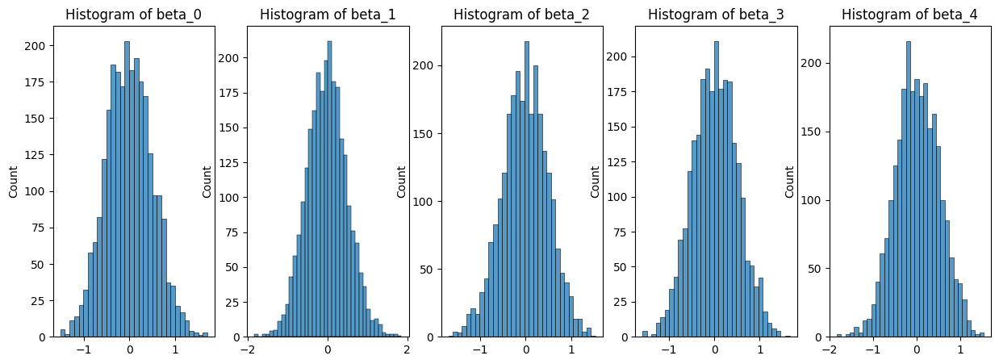

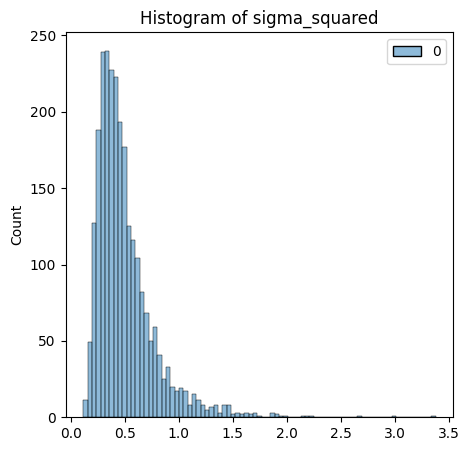

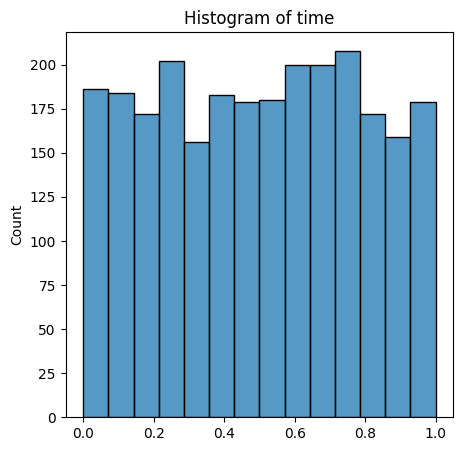

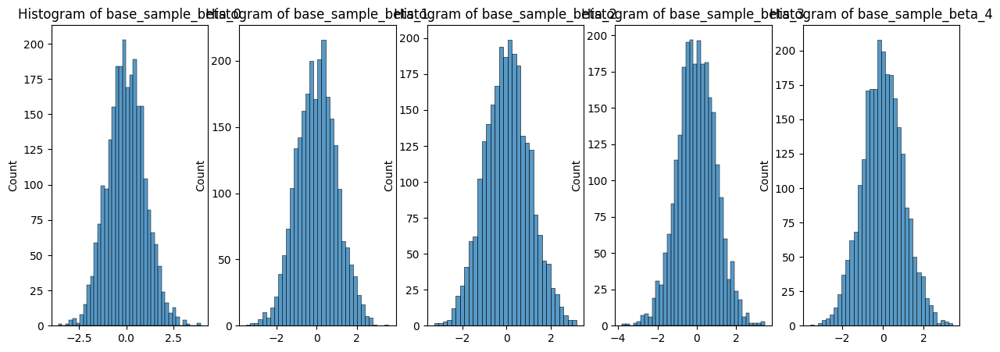

[{'X': {'mean': tensor(0.5005),
   'variance': tensor(0.0833),
   'min': tensor(1.7881e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.4934),
   'variance': tensor(0.2500),
   'min': tensor(0.),
   'max': tensor(1.)},
  'beta': {'mean': tensor([-0.0077, -0.0094, -0.0213,  0.0028, -0.0147]),
   'variance': tensor([0.2427, 0.2486, 0.2445, 0.2553, 0.2363]),
   'min': tensor([-1.5452, -1.9955, -1.6612, -2.0268, -1.7035]),
   'max': tensor([1.7917, 2.3758, 1.8055, 1.8129, 1.5239])}},
 {'X': {'mean': tensor(0.5001),
   'variance': tensor(0.0833),
   'min': tensor(7.1526e-07),
   'max': tensor(1.0000)},
  'y': {'mean': tensor(0.4988),
   'variance': tensor(0.2500),
   'min': tensor(0.),
   'max': tensor(1.)},
  'beta': {'mean': tensor([-0.0100, -0.0105, -0.0211,  0.0130,  0.0098]),
   'variance': tensor([0.2521, 0.2506, 0.2511, 0.2443, 0.2531]),
   'min': tensor([-1.5073, -1.8266, -1.6904, -1.5855, -1.8387]),
   'max': tensor([1.7041, 1.8548, 1.5286, 1.6605, 1.5400])}}]

In [ ]:

data_generator.check_model(
    n_samples_per_epoch=N_SAMPLES_PER_EPOCH,
    epochs_to_check = [0, N_EPOCHS-1],
    p = 5,
    used_batch_samples = 10
)


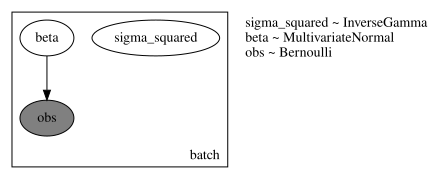

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
sample_batch = next(iter(epoch_loader[0][0]))

In [ ]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'time', 'base_sample_beta'])

In [ ]:

model = TransformerCNFConditionalDecoder(
    n_input_features_encoder = P+1,
    n_input_features_decoder = P,
    d_model_encoder = 512,
    d_model_decoder = 512,
    n_heads_encoder = 8,
    n_heads_decoder = 8,
    d_ff_encoder = 1024,
    d_ff_decoder = 1024,
    dropout_encoder = 0.1,
    dropout_decoder = 0.1,
    n_conditional_input_features =  1,
    n_condition_features = 512,
    n_layers_condition_embedding = 3,
    n_layers_encoder = 8,
    n_layers_decoder = 6,
    use_positional_encoding_encoder = True,
    use_positional_encoding_decoder = False,
    use_self_attention_decoder = False,
    output_dim = P,
    d_final_processing = 512,
    n_final_layers = 3,
    dropout_final = 0.1,
    treat_z_as_sequence = False,
)

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'4.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-6
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOT2(
    sigma_min=1e-4
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor= 1e3)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    coupling = None,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    max_gradient_norm = 1.0

)

In [ ]:
#trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_26_19_51_47")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_08_02_11_43_06'

In [ ]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

Could not load model


In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:19<00:00,  2.52it/s]


{'loss_mean': 1.360499620437622,
 'loss_median': 1.3635801076889038,
 'loss_std': 0.021016519516706467}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 0:
Training: {'loss_mean': 1.4463491439819336, 'loss_median': 1.433933138847351, 'loss_std': 0.04874299466609955}
Validation: {'loss_mean': 1.2565268278121948, 'loss_median': 1.2613576650619507, 'loss_std': 0.017477508634328842}
Validation curriculum: {'loss_mean': 1.2580522298812866, 'loss_median': 1.2589055299758911, 'loss_std': 0.019742177799344063}
Time: 300.6195378303528
Learning rate: [4.5912014239188825e-06]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 249856


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 1:
Training: {'loss_mean': 1.3865694999694824, 'loss_median': 1.3863731622695923, 'loss_std': 0.02429436706006527}
Validation: {'loss_mean': 1.2574858665466309, 'loss_median': 1.2558225393295288, 'loss_std': 0.019913217052817345}
Validation curriculum: {'loss_mean': 1.2581303119659424, 'loss_median': 1.256749153137207, 'loss_std': 0.017799800261855125}
Time: 300.1233329772949
Learning rate: [6.3502423988570276e-06]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 499712


100%|██████████| 49/49 [00:18<00:00,  2.59it/s]


Epoch 2:
Training: {'loss_mean': 1.3499159812927246, 'loss_median': 1.350143313407898, 'loss_std': 0.019758421927690506}
Validation: {'loss_mean': 1.2567522525787354, 'loss_median': 1.258649230003357, 'loss_std': 0.014960582368075848}
Validation curriculum: {'loss_mean': 1.2514296770095825, 'loss_median': 1.2499650716781616, 'loss_std': 0.020396720618009567}
Time: 300.12067914009094
Learning rate: [9.233791777767968e-06]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 749568


100%|██████████| 49/49 [00:18<00:00,  2.59it/s]


Epoch 3:
Training: {'loss_mean': 1.3174991607666016, 'loss_median': 1.316580057144165, 'loss_std': 0.0216210950165987}
Validation: {'loss_mean': 1.2518723011016846, 'loss_median': 1.2500206232070923, 'loss_std': 0.01617700606584549}
Validation curriculum: {'loss_mean': 1.254689335823059, 'loss_median': 1.2556761503219604, 'loss_std': 0.016771571710705757}
Time: 300.0452380180359
Learning rate: [1.317081795653704e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 999424


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 4:
Training: {'loss_mean': 1.2932751178741455, 'loss_median': 1.2931545972824097, 'loss_std': 0.018409131094813347}
Validation: {'loss_mean': 1.2496546506881714, 'loss_median': 1.2500228881835938, 'loss_std': 0.017376266419887543}
Validation curriculum: {'loss_mean': 1.2525595426559448, 'loss_median': 1.2516167163848877, 'loss_std': 0.015065773390233517}
Time: 302.697970867157
Learning rate: [1.806433862337696e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 1249280


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 5:
Training: {'loss_mean': 1.2789490222930908, 'loss_median': 1.2771075963974, 'loss_std': 0.018511133268475533}
Validation: {'loss_mean': 1.2539719343185425, 'loss_median': 1.2520664930343628, 'loss_std': 0.018148640170693398}
Validation curriculum: {'loss_mean': 1.2525334358215332, 'loss_median': 1.2526377439498901, 'loss_std': 0.01811680756509304}
Time: 302.52590823173523
Learning rate: [2.3793809762195578e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 1499136


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 6:
Training: {'loss_mean': 1.2666382789611816, 'loss_median': 1.2659727334976196, 'loss_std': 0.018035415560007095}
Validation: {'loss_mean': 1.2502208948135376, 'loss_median': 1.2492575645446777, 'loss_std': 0.013638387434184551}
Validation curriculum: {'loss_mean': 1.2516205310821533, 'loss_median': 1.2536391019821167, 'loss_std': 0.014853901229798794}
Time: 300.00182056427
Learning rate: [3.021809506067739e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 1748992


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 7:
Training: {'loss_mean': 1.2617411613464355, 'loss_median': 1.26138174533844, 'loss_std': 0.018629683181643486}
Validation: {'loss_mean': 1.2500704526901245, 'loss_median': 1.2466683387756348, 'loss_std': 0.01765974424779415}
Validation curriculum: {'loss_mean': 1.2566657066345215, 'loss_median': 1.259272575378418, 'loss_std': 0.018765484914183617}
Time: 300.00409269332886
Learning rate: [3.717894257648391e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 1998848


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 8:
Training: {'loss_mean': 1.2559956312179565, 'loss_median': 1.2564388513565063, 'loss_std': 0.017985008656978607}
Validation: {'loss_mean': 1.2527551651000977, 'loss_median': 1.254368782043457, 'loss_std': 0.01711227558553219}
Validation curriculum: {'loss_mean': 1.2495086193084717, 'loss_median': 1.2505171298980713, 'loss_std': 0.020851729437708855}
Time: 299.7348310947418
Learning rate: [4.4504883019489024e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 2248704


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 9:
Training: {'loss_mean': 1.2546287775039673, 'loss_median': 1.2563663721084595, 'loss_std': 0.01751507632434368}
Validation: {'loss_mean': 1.2512145042419434, 'loss_median': 1.2488738298416138, 'loss_std': 0.01538816373795271}
Validation curriculum: {'loss_mean': 1.24859619140625, 'loss_median': 1.2487008571624756, 'loss_std': 0.01568497344851494}
Time: 300.13182282447815
Learning rate: [5.201545362213232e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 2498560


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 10:
Training: {'loss_mean': 1.2411831617355347, 'loss_median': 1.241899013519287, 'loss_std': 0.020824074745178223}
Validation: {'loss_mean': 1.2180815935134888, 'loss_median': 1.2161074876785278, 'loss_std': 0.017003312706947327}
Validation curriculum: {'loss_mean': 1.2239304780960083, 'loss_median': 1.2205581665039062, 'loss_std': 0.015449871309101582}
Time: 302.5866870880127
Learning rate: [5.9525643549633576e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 2748416


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 11:
Training: {'loss_mean': 1.217678189277649, 'loss_median': 1.2174654006958008, 'loss_std': 0.01876218058168888}
Validation: {'loss_mean': 1.2119154930114746, 'loss_median': 1.2101387977600098, 'loss_std': 0.0162812490016222}
Validation curriculum: {'loss_mean': 1.2193564176559448, 'loss_median': 1.2208353281021118, 'loss_std': 0.018067767843604088}
Time: 302.44689297676086
Learning rate: [6.685045134453276e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 2998272


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 12:
Training: {'loss_mean': 1.2043055295944214, 'loss_median': 1.2047078609466553, 'loss_std': 0.016680974513292313}
Validation: {'loss_mean': 1.201951265335083, 'loss_median': 1.2000776529312134, 'loss_std': 0.015994863584637642}
Validation curriculum: {'loss_mean': 1.199946641921997, 'loss_median': 1.1975115537643433, 'loss_std': 0.018655357882380486}
Time: 299.86823177337646
Learning rate: [7.380944214023505e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 3248128


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 13:
Training: {'loss_mean': 1.1860250234603882, 'loss_median': 1.1847337484359741, 'loss_std': 0.019403476268053055}
Validation: {'loss_mean': 1.1643184423446655, 'loss_median': 1.1619551181793213, 'loss_std': 0.016124924644827843}
Validation curriculum: {'loss_mean': 1.1612436771392822, 'loss_median': 1.1599493026733398, 'loss_std': 0.015667689964175224}
Time: 299.8124370574951
Learning rate: [8.023119238392972e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 3497984


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 14:
Training: {'loss_mean': 1.1637297868728638, 'loss_median': 1.1641024351119995, 'loss_std': 0.016713591292500496}
Validation: {'loss_mean': 1.1615175008773804, 'loss_median': 1.1616110801696777, 'loss_std': 0.015083516016602516}
Validation curriculum: {'loss_mean': 1.1626354455947876, 'loss_median': 1.1600029468536377, 'loss_std': 0.017738092690706253}
Time: 299.73113775253296
Learning rate: [8.595751258027823e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 3747840


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 15:
Training: {'loss_mean': 1.153396487236023, 'loss_median': 1.1534016132354736, 'loss_std': 0.016786081716418266}
Validation: {'loss_mean': 1.1693971157073975, 'loss_median': 1.1717699766159058, 'loss_std': 0.017339901998639107}
Validation curriculum: {'loss_mean': 1.1665637493133545, 'loss_median': 1.168941855430603, 'loss_std': 0.016443895176053047}
Time: 300.0031292438507
Learning rate: [9.084734403536829e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 3997696


100%|██████████| 49/49 [00:18<00:00,  2.65it/s]


Epoch 16:
Training: {'loss_mean': 1.1491979360580444, 'loss_median': 1.1483548879623413, 'loss_std': 0.01721041649580002}
Validation: {'loss_mean': 1.1535170078277588, 'loss_median': 1.1523205041885376, 'loss_std': 0.018823502585291862}
Validation curriculum: {'loss_mean': 1.151807427406311, 'loss_median': 1.1518948078155518, 'loss_std': 0.016042552888393402}
Time: 302.1781601905823
Learning rate: [9.47802336109093e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 4247552


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 17:
Training: {'loss_mean': 1.143303394317627, 'loss_median': 1.1450270414352417, 'loss_std': 0.017032496631145477}
Validation: {'loss_mean': 1.133052110671997, 'loss_median': 1.1333277225494385, 'loss_std': 0.015539347194135189}
Validation curriculum: {'loss_mean': 1.1352252960205078, 'loss_median': 1.1349996328353882, 'loss_std': 0.019476238638162613}
Time: 302.60866498947144
Learning rate: [9.765930089368567e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 4497408


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 18:
Training: {'loss_mean': 1.1401492357254028, 'loss_median': 1.1396713256835938, 'loss_std': 0.016209332272410393}
Validation: {'loss_mean': 1.139972448348999, 'loss_median': 1.137891411781311, 'loss_std': 0.020152855664491653}
Validation curriculum: {'loss_mean': 1.1428428888320923, 'loss_median': 1.147049069404602, 'loss_std': 0.01456399541348219}
Time: 300.0189344882965
Learning rate: [9.941362468881673e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 4747264


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 19:
Training: {'loss_mean': 1.1324959993362427, 'loss_median': 1.1318244934082031, 'loss_std': 0.018070179969072342}
Validation: {'loss_mean': 1.1230266094207764, 'loss_median': 1.1229536533355713, 'loss_std': 0.01379842683672905}
Validation curriculum: {'loss_mean': 1.123153805732727, 'loss_median': 1.1225734949111938, 'loss_std': 0.019686324521899223}
Time: 299.59155654907227
Learning rate: [9.9999999872092e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 4997120


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 20:
Training: {'loss_mean': 1.1271332502365112, 'loss_median': 1.1257823705673218, 'loss_std': 0.016825081780552864}
Validation: {'loss_mean': 1.1334460973739624, 'loss_median': 1.1305418014526367, 'loss_std': 0.019597770646214485}
Validation curriculum: {'loss_mean': 1.135892629623413, 'loss_median': 1.1358928680419922, 'loss_std': 0.013818064704537392}
Time: 299.9320089817047
Learning rate: [9.999232251860418e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 5246976


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 21:
Training: {'loss_mean': 1.1244182586669922, 'loss_median': 1.124158263206482, 'loss_std': 0.019400659948587418}
Validation: {'loss_mean': 1.1299630403518677, 'loss_median': 1.1267544031143188, 'loss_std': 0.013454540632665157}
Validation curriculum: {'loss_mean': 1.1292436122894287, 'loss_median': 1.1287142038345337, 'loss_std': 0.018733320757746696}
Time: 299.75350284576416
Learning rate: [9.996941762861006e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 5496832


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 22:
Training: {'loss_mean': 1.1158878803253174, 'loss_median': 1.117404580116272, 'loss_std': 0.01675337553024292}
Validation: {'loss_mean': 1.1161832809448242, 'loss_median': 1.1157845258712769, 'loss_std': 0.01787807233631611}
Validation curriculum: {'loss_mean': 1.118765115737915, 'loss_median': 1.1181696653366089, 'loss_std': 0.018358176574110985}
Time: 302.43031430244446
Learning rate: [9.993129217916102e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 5746688


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 23:
Training: {'loss_mean': 1.1105146408081055, 'loss_median': 1.110285997390747, 'loss_std': 0.016678564250469208}
Validation: {'loss_mean': 1.1158926486968994, 'loss_median': 1.115662693977356, 'loss_std': 0.014179393649101257}
Validation curriculum: {'loss_mean': 1.120088815689087, 'loss_median': 1.1185333728790283, 'loss_std': 0.016875794157385826}
Time: 302.6031723022461
Learning rate: [9.98779577836383e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 5996544


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 24:
Training: {'loss_mean': 1.1240483522415161, 'loss_median': 1.122658371925354, 'loss_std': 0.021140433847904205}
Validation: {'loss_mean': 1.140223503112793, 'loss_median': 1.1411679983139038, 'loss_std': 0.01619132049381733}
Validation curriculum: {'loss_mean': 1.1421177387237549, 'loss_median': 1.1439255475997925, 'loss_std': 0.018191564828157425}
Time: 299.94739174842834
Learning rate: [9.980943068821543e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 6246400


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 25:
Training: {'loss_mean': 1.1188186407089233, 'loss_median': 1.1179383993148804, 'loss_std': 0.01979805715382099}
Validation: {'loss_mean': 1.1067137718200684, 'loss_median': 1.10697340965271, 'loss_std': 0.016269009560346603}
Validation curriculum: {'loss_mean': 1.10578453540802, 'loss_median': 1.1078951358795166, 'loss_std': 0.01718093641102314}
Time: 299.5874288082123
Learning rate: [9.972573176690952e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 6496256


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 26:
Training: {'loss_mean': 1.1133012771606445, 'loss_median': 1.1134628057479858, 'loss_std': 0.016631335020065308}
Validation: {'loss_mean': 1.102476954460144, 'loss_median': 1.10317063331604, 'loss_std': 0.019367866218090057}
Validation curriculum: {'loss_mean': 1.1039061546325684, 'loss_median': 1.1028071641921997, 'loss_std': 0.013758298009634018}
Time: 299.8396472930908
Learning rate: [9.962688651522277e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 6746112


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 27:
Training: {'loss_mean': 1.1052230596542358, 'loss_median': 1.1047533750534058, 'loss_std': 0.016154302284121513}
Validation: {'loss_mean': 1.0958425998687744, 'loss_median': 1.094329833984375, 'loss_std': 0.018465442582964897}
Validation curriculum: {'loss_mean': 1.0891658067703247, 'loss_median': 1.0854911804199219, 'loss_std': 0.016507579013705254}
Time: 299.88893246650696
Learning rate: [9.951292504237644e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 6995968


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 28:
Training: {'loss_mean': 1.0814077854156494, 'loss_median': 1.0824010372161865, 'loss_std': 0.01608407497406006}
Validation: {'loss_mean': 1.059554934501648, 'loss_median': 1.0580171346664429, 'loss_std': 0.017925294116139412}
Validation curriculum: {'loss_mean': 1.0614612102508545, 'loss_median': 1.0612810850143433, 'loss_std': 0.014216195791959763}
Time: 302.441974401474
Learning rate: [9.93838820621391e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 7245824


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 29:
Training: {'loss_mean': 1.0658677816390991, 'loss_median': 1.0650163888931274, 'loss_std': 0.01614726148545742}
Validation: {'loss_mean': 1.06671941280365, 'loss_median': 1.0694316625595093, 'loss_std': 0.01594461128115654}
Validation curriculum: {'loss_mean': 1.0656652450561523, 'loss_median': 1.0655063390731812, 'loss_std': 0.01354992762207985}
Time: 302.58407735824585
Learning rate: [9.923979688225261e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 7495680


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 30:
Training: {'loss_mean': 1.0563472509384155, 'loss_median': 1.0556671619415283, 'loss_std': 0.01807682029902935}
Validation: {'loss_mean': 1.0298335552215576, 'loss_median': 1.0311647653579712, 'loss_std': 0.015071149915456772}
Validation curriculum: {'loss_mean': 1.0281442403793335, 'loss_median': 1.0311471223831177, 'loss_std': 0.014791867695748806}
Time: 299.94753074645996
Learning rate: [9.908071339245852e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 7745536


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 31:
Training: {'loss_mean': 1.0335506200790405, 'loss_median': 1.0325634479522705, 'loss_std': 0.015045886859297752}
Validation: {'loss_mean': 1.031786322593689, 'loss_median': 1.0316559076309204, 'loss_std': 0.017192231491208076}
Validation curriculum: {'loss_mean': 1.0348098278045654, 'loss_median': 1.0332200527191162, 'loss_std': 0.016864828765392303}
Time: 299.66525864601135
Learning rate: [9.890668005112893e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 7995392


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 32:
Training: {'loss_mean': 1.010274052619934, 'loss_median': 1.009188175201416, 'loss_std': 0.019042734056711197}
Validation: {'loss_mean': 0.9936376810073853, 'loss_median': 0.9931303262710571, 'loss_std': 0.014847580343484879}
Validation curriculum: {'loss_mean': 0.9929008483886719, 'loss_median': 0.9947628378868103, 'loss_std': 0.014701584354043007}
Time: 299.6073832511902
Learning rate: [9.871774987050548e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 8245248


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 33:
Training: {'loss_mean': 0.9850191473960876, 'loss_median': 0.9860368967056274, 'loss_std': 0.016111556440591812}
Validation: {'loss_mean': 0.9719798564910889, 'loss_median': 0.9729868769645691, 'loss_std': 0.015542212873697281}
Validation curriculum: {'loss_mean': 0.9697113037109375, 'loss_median': 0.9686831831932068, 'loss_std': 0.016164645552635193}
Time: 299.9364216327667
Learning rate: [9.85139804005514e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 8495104


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 34:
Training: {'loss_mean': 0.9726161360740662, 'loss_median': 0.9712215662002563, 'loss_std': 0.014940617606043816}
Validation: {'loss_mean': 0.961585283279419, 'loss_median': 0.9614288210868835, 'loss_std': 0.013810844160616398}
Validation curriculum: {'loss_mean': 0.9661646485328674, 'loss_median': 0.9639043211936951, 'loss_std': 0.013562837615609169}
Time: 302.7227759361267
Learning rate: [9.829543371142122e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 8744960


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 35:
Training: {'loss_mean': 0.9615097045898438, 'loss_median': 0.9617937207221985, 'loss_std': 0.0171277467161417}
Validation: {'loss_mean': 0.9318231344223022, 'loss_median': 0.927520215511322, 'loss_std': 0.018108703196048737}
Validation curriculum: {'loss_mean': 0.9357625246047974, 'loss_median': 0.9370166063308716, 'loss_std': 0.0166864562779665}
Time: 302.79862666130066
Learning rate: [9.806217637455354e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 8994816


100%|██████████| 49/49 [00:18<00:00,  2.59it/s]


Epoch 36:
Training: {'loss_mean': 0.8948386311531067, 'loss_median': 0.8948484659194946, 'loss_std': 0.026208344846963882}
Validation: {'loss_mean': 0.8674644231796265, 'loss_median': 0.8642341494560242, 'loss_std': 0.014665056020021439}
Validation curriculum: {'loss_mean': 0.8722741007804871, 'loss_median': 0.868596076965332, 'loss_std': 0.016485420987010002}
Time: 299.87278056144714
Learning rate: [9.78142794423928e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 9244672


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 37:
Training: {'loss_mean': 0.8465527296066284, 'loss_median': 0.8461874127388, 'loss_std': 0.016291387379169464}
Validation: {'loss_mean': 0.8317227363586426, 'loss_median': 0.833105206489563, 'loss_std': 0.01389684621244669}
Validation curriculum: {'loss_mean': 0.8290591835975647, 'loss_median': 0.8286096453666687, 'loss_std': 0.014321261085569859}
Time: 299.9774179458618
Learning rate: [9.755181842674593e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 9494528


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 38:
Training: {'loss_mean': 0.8263595104217529, 'loss_median': 0.8254026770591736, 'loss_std': 0.016042135655879974}
Validation: {'loss_mean': 0.8074101209640503, 'loss_median': 0.8049556612968445, 'loss_std': 0.015967460349202156}
Validation curriculum: {'loss_mean': 0.8094586730003357, 'loss_median': 0.8090648651123047, 'loss_std': 0.014481824822723866}
Time: 299.85776448249817
Learning rate: [9.727487327578086e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 9744384


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 39:
Training: {'loss_mean': 0.8105956315994263, 'loss_median': 0.8104322552680969, 'loss_std': 0.016392866149544716}
Validation: {'loss_mean': 0.7923527359962463, 'loss_median': 0.7945442199707031, 'loss_std': 0.014681423082947731}
Validation curriculum: {'loss_mean': 0.7888847589492798, 'loss_median': 0.7900705933570862, 'loss_std': 0.016349103301763535}
Time: 300.03352999687195
Learning rate: [9.698352834967338e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 9994240


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 40:
Training: {'loss_mean': 0.7722744345664978, 'loss_median': 0.772489070892334, 'loss_std': 0.018336765468120575}
Validation: {'loss_mean': 0.7524439096450806, 'loss_median': 0.7542546987533569, 'loss_std': 0.013211823999881744}
Validation curriculum: {'loss_mean': 0.7533604502677917, 'loss_median': 0.753376305103302, 'loss_std': 0.015388174913823605}
Time: 302.70586919784546
Learning rate: [9.667787239491031e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 10244096


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 41:
Training: {'loss_mean': 0.7636932730674744, 'loss_median': 0.763421356678009, 'loss_std': 0.014991875737905502}
Validation: {'loss_mean': 0.751739501953125, 'loss_median': 0.751975417137146, 'loss_std': 0.01480164285749197}
Validation curriculum: {'loss_mean': 0.7538782358169556, 'loss_median': 0.7525480389595032, 'loss_std': 0.014585047960281372}
Time: 302.3808147907257
Learning rate: [9.63579985172564e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 10493952


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 42:
Training: {'loss_mean': 0.7608588933944702, 'loss_median': 0.7590090036392212, 'loss_std': 0.01534082181751728}
Validation: {'loss_mean': 0.7522549033164978, 'loss_median': 0.7489043474197388, 'loss_std': 0.017347631976008415}
Validation curriculum: {'loss_mean': 0.754577100276947, 'loss_median': 0.7551037073135376, 'loss_std': 0.018359242007136345}
Time: 299.95374035835266
Learning rate: [9.60240041533935e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 10743808


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 43:
Training: {'loss_mean': 0.7580474019050598, 'loss_median': 0.7566078901290894, 'loss_std': 0.014743744395673275}
Validation: {'loss_mean': 0.7564088702201843, 'loss_median': 0.7563022971153259, 'loss_std': 0.013534079305827618}
Validation curriculum: {'loss_mean': 0.7555984258651733, 'loss_median': 0.7557353973388672, 'loss_std': 0.013256133534014225}
Time: 299.93268847465515
Learning rate: [9.567599104124033e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 10993664


100%|██████████| 49/49 [00:18<00:00,  2.65it/s]


Epoch 44:
Training: {'loss_mean': 0.7566885352134705, 'loss_median': 0.7577296495437622, 'loss_std': 0.01592555083334446}
Validation: {'loss_mean': 0.7523260116577148, 'loss_median': 0.7562341094017029, 'loss_std': 0.013763155788183212}
Validation curriculum: {'loss_mean': 0.7500954270362854, 'loss_median': 0.7517603039741516, 'loss_std': 0.01344495452940464}
Time: 299.71192955970764
Learning rate: [9.531406518896209e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 11243520


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 45:
Training: {'loss_mean': 0.7535008788108826, 'loss_median': 0.7532047629356384, 'loss_std': 0.016443364322185516}
Validation: {'loss_mean': 0.748553454875946, 'loss_median': 0.7464249730110168, 'loss_std': 0.016610732302069664}
Validation curriculum: {'loss_mean': 0.7431647777557373, 'loss_median': 0.744161069393158, 'loss_std': 0.014191335998475552}
Time: 299.9835238456726
Learning rate: [9.493833684267946e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 11493376


100%|██████████| 49/49 [00:18<00:00,  2.65it/s]


Epoch 46:
Training: {'loss_mean': 0.7402896285057068, 'loss_median': 0.7401224970817566, 'loss_std': 0.015404073521494865}
Validation: {'loss_mean': 0.7201682329177856, 'loss_median': 0.7223518490791321, 'loss_std': 0.01504275482147932}
Validation curriculum: {'loss_mean': 0.7266854047775269, 'loss_median': 0.7277774214744568, 'loss_std': 0.012973863631486893}
Time: 302.4918956756592
Learning rate: [9.454892045288648e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 11743232


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 47:
Training: {'loss_mean': 0.7061825394630432, 'loss_median': 0.7053709030151367, 'loss_std': 0.016206469386816025}
Validation: {'loss_mean': 0.6970794200897217, 'loss_median': 0.6947508454322815, 'loss_std': 0.013942766934633255}
Validation curriculum: {'loss_mean': 0.6990188360214233, 'loss_median': 0.6979943513870239, 'loss_std': 0.015270588919520378}
Time: 302.6458098888397
Learning rate: [9.414593463958787e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 11993088


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 48:
Training: {'loss_mean': 0.7019906044006348, 'loss_median': 0.7014318704605103, 'loss_std': 0.015761416405439377}
Validation: {'loss_mean': 0.6870046854019165, 'loss_median': 0.689176082611084, 'loss_std': 0.014317936263978481}
Validation curriculum: {'loss_mean': 0.6887440085411072, 'loss_median': 0.6871912479400635, 'loss_std': 0.016712011769413948}
Time: 300.0501685142517
Learning rate: [9.372950215616612e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 12242944


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 49:
Training: {'loss_mean': 0.7004997134208679, 'loss_median': 0.7007221579551697, 'loss_std': 0.01510921586304903}
Validation: {'loss_mean': 0.6908406615257263, 'loss_median': 0.6899989247322083, 'loss_std': 0.015440664254128933}
Validation curriculum: {'loss_mean': 0.6904060244560242, 'loss_median': 0.6876750588417053, 'loss_std': 0.013917304575443268}
Time: 300.0440571308136
Learning rate: [9.329974985198978e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 12492800


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 50:
Training: {'loss_mean': 0.7001045346260071, 'loss_median': 0.6994107365608215, 'loss_std': 0.014423049055039883}
Validation: {'loss_mean': 0.6929402351379395, 'loss_median': 0.6915237307548523, 'loss_std': 0.014608477242290974}
Validation curriculum: {'loss_mean': 0.6906405091285706, 'loss_median': 0.6912505626678467, 'loss_std': 0.013883335515856743}
Time: 299.87505078315735
Learning rate: [9.28568086337738e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 12742656


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 51:
Training: {'loss_mean': 0.696668803691864, 'loss_median': 0.6966299414634705, 'loss_std': 0.014444696716964245}
Validation: {'loss_mean': 0.6864293813705444, 'loss_median': 0.6862286329269409, 'loss_std': 0.016225086525082588}
Validation curriculum: {'loss_mean': 0.689490020275116, 'loss_median': 0.6882230639457703, 'loss_std': 0.016235962510108948}
Time: 299.98108100891113
Learning rate: [9.240081342570412e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 12992512


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 52:
Training: {'loss_mean': 0.6957991123199463, 'loss_median': 0.6958450675010681, 'loss_std': 0.01434886921197176}
Validation: {'loss_mean': 0.6912837028503418, 'loss_median': 0.6901496648788452, 'loss_std': 0.016674373298883438}
Validation curriculum: {'loss_mean': 0.6885353922843933, 'loss_median': 0.6878675818443298, 'loss_std': 0.013538300059735775}
Time: 302.5271780490875
Learning rate: [9.193190312833846e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 13242368


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 53:
Training: {'loss_mean': 0.6948607563972473, 'loss_median': 0.694668710231781, 'loss_std': 0.015779877081513405}
Validation: {'loss_mean': 0.6855352520942688, 'loss_median': 0.6841971278190613, 'loss_std': 0.01668526604771614}
Validation curriculum: {'loss_mean': 0.6848827004432678, 'loss_median': 0.6848787665367126, 'loss_std': 0.015102540142834187}
Time: 302.8070340156555
Learning rate: [9.14502205762958e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 13492224


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 54:
Training: {'loss_mean': 0.6604015231132507, 'loss_median': 0.6583665013313293, 'loss_std': 0.022284237667918205}
Validation: {'loss_mean': 0.6416741609573364, 'loss_median': 0.6390311121940613, 'loss_std': 0.017005374655127525}
Validation curriculum: {'loss_mean': 0.6411893367767334, 'loss_median': 0.6404424905776978, 'loss_std': 0.012486611492931843}
Time: 299.9933931827545
Learning rate: [9.095591249474768e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 13742080


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 55:
Training: {'loss_mean': 0.641295313835144, 'loss_median': 0.6422497630119324, 'loss_std': 0.015379099175333977}
Validation: {'loss_mean': 0.6319673657417297, 'loss_median': 0.6316924095153809, 'loss_std': 0.012482594698667526}
Validation curriculum: {'loss_mean': 0.6312174797058105, 'loss_median': 0.631830096244812, 'loss_std': 0.013018536381423473}
Time: 299.7636330127716
Learning rate: [9.044912945472419e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 13991936


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 56:
Training: {'loss_mean': 0.6394166946411133, 'loss_median': 0.640148937702179, 'loss_std': 0.014584261924028397}
Validation: {'loss_mean': 0.6317276358604431, 'loss_median': 0.6315134763717651, 'loss_std': 0.011250250972807407}
Validation curriculum: {'loss_mean': 0.6325323581695557, 'loss_median': 0.6330841183662415, 'loss_std': 0.015961552038788795}
Time: 299.97837376594543
Learning rate: [8.993002582724865e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 14241792


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 57:
Training: {'loss_mean': 0.6397934556007385, 'loss_median': 0.6397597193717957, 'loss_std': 0.015592115931212902}
Validation: {'loss_mean': 0.6312705874443054, 'loss_median': 0.6337974071502686, 'loss_std': 0.015582410618662834}
Validation curriculum: {'loss_mean': 0.6337616443634033, 'loss_median': 0.6330105662345886, 'loss_std': 0.016367338597774506}
Time: 299.64547634124756
Learning rate: [8.939875973631466e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 14491648


100%|██████████| 49/49 [00:18<00:00,  2.59it/s]


Epoch 58:
Training: {'loss_mean': 0.6385945677757263, 'loss_median': 0.6387878656387329, 'loss_std': 0.014836304821074009}
Validation: {'loss_mean': 0.6282553672790527, 'loss_median': 0.6266779899597168, 'loss_std': 0.01433289423584938}
Validation curriculum: {'loss_mean': 0.6233266592025757, 'loss_median': 0.6208254098892212, 'loss_std': 0.014496850781142712}
Time: 302.5559718608856
Learning rate: [8.885549301072e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 14741504


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 59:
Training: {'loss_mean': 0.6384429931640625, 'loss_median': 0.6372281908988953, 'loss_std': 0.014208211563527584}
Validation: {'loss_mean': 0.6327468156814575, 'loss_median': 0.6314267516136169, 'loss_std': 0.01627524010837078}
Validation curriculum: {'loss_mean': 0.6331501603126526, 'loss_median': 0.6327391862869263, 'loss_std': 0.014831368811428547}
Time: 302.6509974002838
Learning rate: [8.830039113477206e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 14991360


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 60:
Training: {'loss_mean': 0.6389104127883911, 'loss_median': 0.6377869844436646, 'loss_std': 0.014958188869059086}
Validation: {'loss_mean': 0.6238874793052673, 'loss_median': 0.628460705280304, 'loss_std': 0.014617555774748325}
Validation curriculum: {'loss_mean': 0.626434326171875, 'loss_median': 0.6269161105155945, 'loss_std': 0.013283994980156422}
Time: 299.9180974960327
Learning rate: [8.773362319787961e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 15241216


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 61:
Training: {'loss_mean': 0.6368260383605957, 'loss_median': 0.6356621980667114, 'loss_std': 0.014361810870468616}
Validation: {'loss_mean': 0.6289666295051575, 'loss_median': 0.6266547441482544, 'loss_std': 0.01495360117405653}
Validation curriculum: {'loss_mean': 0.6281259059906006, 'loss_median': 0.6300752758979797, 'loss_std': 0.014433750882744789}
Time: 299.99353885650635
Learning rate: [8.715536184304664e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 15491072


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 62:
Training: {'loss_mean': 0.6359643936157227, 'loss_median': 0.6353301405906677, 'loss_std': 0.014924435876309872}
Validation: {'loss_mean': 0.624902069568634, 'loss_median': 0.6252623796463013, 'loss_std': 0.014657772146165371}
Validation curriculum: {'loss_mean': 0.6260473132133484, 'loss_median': 0.6245949864387512, 'loss_std': 0.014050854369997978}
Time: 300.0766797065735
Learning rate: [8.65657832142836e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 15740928


100%|██████████| 49/49 [00:18<00:00,  2.59it/s]


Epoch 63:
Training: {'loss_mean': 0.6336495876312256, 'loss_median': 0.6326143145561218, 'loss_std': 0.014216664247214794}
Validation: {'loss_mean': 0.6226911544799805, 'loss_median': 0.6245404481887817, 'loss_std': 0.01599131152033806}
Validation curriculum: {'loss_mean': 0.6295648813247681, 'loss_median': 0.6296970844268799, 'loss_std': 0.013685463927686214}
Time: 299.83917760849
Learning rate: [8.596506690295214e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 15990784


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 64:
Training: {'loss_mean': 0.6341537833213806, 'loss_median': 0.6337980031967163, 'loss_std': 0.016135983169078827}
Validation: {'loss_mean': 0.6305149793624878, 'loss_median': 0.6269294619560242, 'loss_std': 0.012640350498259068}
Validation curriculum: {'loss_mean': 0.6249164938926697, 'loss_median': 0.627299427986145, 'loss_std': 0.015476549044251442}
Time: 302.4800510406494
Learning rate: [8.535339589306e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 16240640


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 65:
Training: {'loss_mean': 0.6351195573806763, 'loss_median': 0.634754478931427, 'loss_std': 0.014382477849721909}
Validation: {'loss_mean': 0.6266804337501526, 'loss_median': 0.6300198435783386, 'loss_std': 0.011907464824616909}
Validation curriculum: {'loss_mean': 0.6312376260757446, 'loss_median': 0.6292421817779541, 'loss_std': 0.01627148687839508}
Time: 302.6224193572998
Learning rate: [8.473095650552218e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 16490496


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 66:
Training: {'loss_mean': 0.6345505714416504, 'loss_median': 0.6337620615959167, 'loss_std': 0.014560660347342491}
Validation: {'loss_mean': 0.6248273849487305, 'loss_median': 0.62590092420578, 'loss_std': 0.01286762859672308}
Validation curriculum: {'loss_mean': 0.628669261932373, 'loss_median': 0.6286073923110962, 'loss_std': 0.013153277337551117}
Time: 299.92751145362854
Learning rate: [8.40979383414058e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 16740352


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 67:
Training: {'loss_mean': 0.635080099105835, 'loss_median': 0.6357982754707336, 'loss_std': 0.01483150664716959}
Validation: {'loss_mean': 0.6245326399803162, 'loss_median': 0.6232017874717712, 'loss_std': 0.016987061128020287}
Validation curriculum: {'loss_mean': 0.62446129322052, 'loss_median': 0.6240746378898621, 'loss_std': 0.014248333871364594}
Time: 299.6870551109314
Learning rate: [8.345453422417589e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 16990208


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 68:
Training: {'loss_mean': 0.6341615319252014, 'loss_median': 0.6342615485191345, 'loss_std': 0.015236166305840015}
Validation: {'loss_mean': 0.625902533531189, 'loss_median': 0.6251114010810852, 'loss_std': 0.013127278536558151}
Validation curriculum: {'loss_mean': 0.6259901523590088, 'loss_median': 0.6257511973381042, 'loss_std': 0.014824501238763332}
Time: 299.84006786346436
Learning rate: [8.280094014095928e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 17240064


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 69:
Training: {'loss_mean': 0.6337640285491943, 'loss_median': 0.6325910091400146, 'loss_std': 0.015055433847010136}
Validation: {'loss_mean': 0.6306900978088379, 'loss_median': 0.629740834236145, 'loss_std': 0.013563715852797031}
Validation curriculum: {'loss_mean': 0.635597825050354, 'loss_median': 0.6363703012466431, 'loss_std': 0.015323147177696228}
Time: 300.0078589916229
Learning rate: [8.21373551828453e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 17489920


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 70:
Training: {'loss_mean': 0.6312313675880432, 'loss_median': 0.6304692625999451, 'loss_std': 0.015120823867619038}
Validation: {'loss_mean': 0.6210774183273315, 'loss_median': 0.624213695526123, 'loss_std': 0.01872572861611843}
Validation curriculum: {'loss_mean': 0.6242862343788147, 'loss_median': 0.6257650256156921, 'loss_std': 0.01568983867764473}
Time: 302.37043952941895
Learning rate: [8.146398148424044e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 17739776


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 71:
Training: {'loss_mean': 0.6343701481819153, 'loss_median': 0.6334673762321472, 'loss_std': 0.015180163085460663}
Validation: {'loss_mean': 0.6267931461334229, 'loss_median': 0.6260671615600586, 'loss_std': 0.015339227393269539}
Validation curriculum: {'loss_mean': 0.6324421763420105, 'loss_median': 0.6309893131256104, 'loss_std': 0.018607115373015404}
Time: 302.6914584636688
Learning rate: [8.078102416129642e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 17989632


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 72:
Training: {'loss_mean': 0.6345829367637634, 'loss_median': 0.632390022277832, 'loss_std': 0.015217178501188755}
Validation: {'loss_mean': 0.6217494010925293, 'loss_median': 0.6215390563011169, 'loss_std': 0.015310809947550297}
Validation curriculum: {'loss_mean': 0.6212252974510193, 'loss_median': 0.6202180981636047, 'loss_std': 0.015686731785535812}
Time: 299.79439187049866
Learning rate: [8.008869124942978e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 18239488


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 73:
Training: {'loss_mean': 0.6332554221153259, 'loss_median': 0.6318854689598083, 'loss_std': 0.01402279268950224}
Validation: {'loss_mean': 0.6226609945297241, 'loss_median': 0.6206318736076355, 'loss_std': 0.012218993157148361}
Validation curriculum: {'loss_mean': 0.6229145526885986, 'loss_median': 0.6254714131355286, 'loss_std': 0.016984572634100914}
Time: 299.7386031150818
Learning rate: [7.938719363995222e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 18489344


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 74:
Training: {'loss_mean': 0.6327782869338989, 'loss_median': 0.6327098608016968, 'loss_std': 0.014388862065970898}
Validation: {'loss_mean': 0.6253993511199951, 'loss_median': 0.627097487449646, 'loss_std': 0.013989646919071674}
Validation curriculum: {'loss_mean': 0.625858724117279, 'loss_median': 0.6242623329162598, 'loss_std': 0.01575596258044243}
Time: 299.90417313575745
Learning rate: [7.867674501583118e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 18739200


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 75:
Training: {'loss_mean': 0.6309316158294678, 'loss_median': 0.6308503150939941, 'loss_std': 0.014674196019768715}
Validation: {'loss_mean': 0.6252219080924988, 'loss_median': 0.6276184916496277, 'loss_std': 0.018331503495573997}
Validation curriculum: {'loss_mean': 0.6237346529960632, 'loss_median': 0.6231850981712341, 'loss_std': 0.014475478790700436}
Time: 299.5429093837738
Learning rate: [7.795756178659981e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 18989056


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 76:
Training: {'loss_mean': 0.63385409116745, 'loss_median': 0.6340086460113525, 'loss_std': 0.014193777926266193}
Validation: {'loss_mean': 0.6233361959457397, 'loss_median': 0.6207143068313599, 'loss_std': 0.01435854658484459}
Validation curriculum: {'loss_mean': 0.6258079409599304, 'loss_median': 0.6251834630966187, 'loss_std': 0.013399002142250538}
Time: 302.60971879959106
Learning rate: [7.722986302243665e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 19238912


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 77:
Training: {'loss_mean': 0.6326337456703186, 'loss_median': 0.631109893321991, 'loss_std': 0.01415544655174017}
Validation: {'loss_mean': 0.6234022974967957, 'loss_median': 0.6228691935539246, 'loss_std': 0.013360213488340378}
Validation curriculum: {'loss_mean': 0.6198071241378784, 'loss_median': 0.619395911693573, 'loss_std': 0.016868116334080696}
Time: 302.48504400253296
Learning rate: [7.649387038743461e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 19488768


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 78:
Training: {'loss_mean': 0.6326595544815063, 'loss_median': 0.6324942111968994, 'loss_std': 0.014601659961044788}
Validation: {'loss_mean': 0.6235440373420715, 'loss_median': 0.6250080466270447, 'loss_std': 0.01693810150027275}
Validation curriculum: {'loss_mean': 0.6229100227355957, 'loss_median': 0.6201871037483215, 'loss_std': 0.013934344984591007}
Time: 299.985018491745
Learning rate: [7.574980807208006e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 19738624


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 79:
Training: {'loss_mean': 0.6320092082023621, 'loss_median': 0.6316515207290649, 'loss_std': 0.014837284572422504}
Validation: {'loss_mean': 0.6239976286888123, 'loss_median': 0.6218661665916443, 'loss_std': 0.013166715390980244}
Validation curriculum: {'loss_mean': 0.6241783499717712, 'loss_median': 0.6241582036018372, 'loss_std': 0.015459069050848484}
Time: 299.9723038673401
Learning rate: [7.499790272496214e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 19988480


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 80:
Training: {'loss_mean': 0.6334353685379028, 'loss_median': 0.6326369643211365, 'loss_std': 0.014589696191251278}
Validation: {'loss_mean': 0.6258730292320251, 'loss_median': 0.623974621295929, 'loss_std': 0.011846491135656834}
Validation curriculum: {'loss_mean': 0.6230090856552124, 'loss_median': 0.6230648159980774, 'loss_std': 0.016699614003300667}
Time: 299.6134765148163
Learning rate: [7.423838338373344e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 20238336


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 81:
Training: {'loss_mean': 0.631428062915802, 'loss_median': 0.6318461298942566, 'loss_std': 0.014485470950603485}
Validation: {'loss_mean': 0.6217572093009949, 'loss_median': 0.6223994493484497, 'loss_std': 0.014536552131175995}
Validation curriculum: {'loss_mean': 0.6246997117996216, 'loss_median': 0.6278281807899475, 'loss_std': 0.016833625733852386}
Time: 299.96146297454834
Learning rate: [7.347148140534293e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 20488192


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 82:
Training: {'loss_mean': 0.6327340006828308, 'loss_median': 0.6319315433502197, 'loss_std': 0.014575405977666378}
Validation: {'loss_mean': 0.6240538954734802, 'loss_median': 0.6224673390388489, 'loss_std': 0.01635695807635784}
Validation curriculum: {'loss_mean': 0.6265594363212585, 'loss_median': 0.6257633566856384, 'loss_std': 0.013472710736095905}
Time: 302.60461592674255
Learning rate: [7.26974303955624e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 20738048


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 83:
Training: {'loss_mean': 0.6327200531959534, 'loss_median': 0.6328626871109009, 'loss_std': 0.014661007560789585}
Validation: {'loss_mean': 0.6232248544692993, 'loss_median': 0.623805820941925, 'loss_std': 0.011734125204384327}
Validation curriculum: {'loss_mean': 0.6216989755630493, 'loss_median': 0.6210846304893494, 'loss_std': 0.015673888847231865}
Time: 302.3653016090393
Learning rate: [7.19164661378278e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 20987904


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 84:
Training: {'loss_mean': 0.6321648955345154, 'loss_median': 0.6319224834442139, 'loss_std': 0.013034988194704056}
Validation: {'loss_mean': 0.619818389415741, 'loss_median': 0.6211571097373962, 'loss_std': 0.015904255211353302}
Validation curriculum: {'loss_mean': 0.6236909627914429, 'loss_median': 0.6246389746665955, 'loss_std': 0.016411777585744858}
Time: 299.7033722400665
Learning rate: [7.112882652141742e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 21237760


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 85:
Training: {'loss_mean': 0.6323384046554565, 'loss_median': 0.6312585473060608, 'loss_std': 0.014837659895420074}
Validation: {'loss_mean': 0.6228125691413879, 'loss_median': 0.6228558421134949, 'loss_std': 0.014445723034441471}
Validation curriculum: {'loss_mean': 0.6235478520393372, 'loss_median': 0.6213934421539307, 'loss_std': 0.012686140835285187}
Time: 299.91003918647766
Learning rate: [7.033475146898844e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 21487616


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 86:
Training: {'loss_mean': 0.6311759948730469, 'loss_median': 0.631038248538971, 'loss_std': 0.015331177040934563}
Validation: {'loss_mean': 0.6217664480209351, 'loss_median': 0.6223109364509583, 'loss_std': 0.013578055426478386}
Validation curriculum: {'loss_mean': 0.6223828792572021, 'loss_median': 0.6232089996337891, 'loss_std': 0.01611446402966976}
Time: 299.8395733833313
Learning rate: [6.953448286349424e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 21737472


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 87:
Training: {'loss_mean': 0.6306922435760498, 'loss_median': 0.6302803158760071, 'loss_std': 0.015031375922262669}
Validation: {'loss_mean': 0.6248889565467834, 'loss_median': 0.625752866268158, 'loss_std': 0.015364011749625206}
Validation curriculum: {'loss_mean': 0.6216316819190979, 'loss_median': 0.6228577494621277, 'loss_std': 0.014653721824288368}
Time: 299.64297127723694
Learning rate: [6.87282644745044e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 21987328


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 88:
Training: {'loss_mean': 0.6301747560501099, 'loss_median': 0.6302834153175354, 'loss_std': 0.014311689883470535}
Validation: {'loss_mean': 0.6241872310638428, 'loss_median': 0.623116135597229, 'loss_std': 0.016204342246055603}
Validation curriculum: {'loss_mean': 0.6222953796386719, 'loss_median': 0.619520902633667, 'loss_std': 0.01492736954241991}
Time: 302.78126430511475
Learning rate: [6.791634188395022e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 22237184


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 89:
Training: {'loss_mean': 0.6299555897712708, 'loss_median': 0.6287586092948914, 'loss_std': 0.01565210334956646}
Validation: {'loss_mean': 0.6227697134017944, 'loss_median': 0.6233395934104919, 'loss_std': 0.016161348670721054}
Validation curriculum: {'loss_mean': 0.6241924166679382, 'loss_median': 0.6227353811264038, 'loss_std': 0.015182380564510822}
Time: 302.7093982696533
Learning rate: [6.709896241131808e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 22487040


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 90:
Training: {'loss_mean': 0.6299886107444763, 'loss_median': 0.6297335624694824, 'loss_std': 0.014588131569325924}
Validation: {'loss_mean': 0.6182557940483093, 'loss_median': 0.616828441619873, 'loss_std': 0.01605822890996933}
Validation curriculum: {'loss_mean': 0.6184099316596985, 'loss_median': 0.6181799173355103, 'loss_std': 0.014477510936558247}
Time: 299.72059774398804
Learning rate: [6.627637503831345e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 22736896


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 91:
Training: {'loss_mean': 0.6303445100784302, 'loss_median': 0.6292222738265991, 'loss_std': 0.014422470703721046}
Validation: {'loss_mean': 0.6220945715904236, 'loss_median': 0.6195369958877563, 'loss_std': 0.013239429332315922}
Validation curriculum: {'loss_mean': 0.6229015588760376, 'loss_median': 0.6205217242240906, 'loss_std': 0.01278845127671957}
Time: 300.0893166065216
Learning rate: [6.544883033301873e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 22986752


100%|██████████| 49/49 [00:18<00:00,  2.61it/s]


Epoch 92:
Training: {'loss_mean': 0.6307626366615295, 'loss_median': 0.6292924880981445, 'loss_std': 0.013401723466813564}
Validation: {'loss_mean': 0.6179139018058777, 'loss_median': 0.6162384152412415, 'loss_std': 0.015255668200552464}
Validation curriculum: {'loss_mean': 0.6180018782615662, 'loss_median': 0.6193317770957947, 'loss_std': 0.01396333146840334}
Time: 299.8874685764313
Learning rate: [6.461658037356777e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 23236608


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 93:
Training: {'loss_mean': 0.629660964012146, 'loss_median': 0.6303007006645203, 'loss_std': 0.01664119027554989}
Validation: {'loss_mean': 0.6211646795272827, 'loss_median': 0.6213157773017883, 'loss_std': 0.01463193167001009}
Validation curriculum: {'loss_mean': 0.6237419843673706, 'loss_median': 0.6254900097846985, 'loss_std': 0.013525581918656826}
Time: 299.7931127548218
Learning rate: [6.37798786713604e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 23486464


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 94:
Training: {'loss_mean': 0.6317631602287292, 'loss_median': 0.63116455078125, 'loss_std': 0.014374429360032082}
Validation: {'loss_mean': 0.6210609674453735, 'loss_median': 0.6179073452949524, 'loss_std': 0.01636066474020481}
Validation curriculum: {'loss_mean': 0.623934805393219, 'loss_median': 0.6244271993637085, 'loss_std': 0.011914578266441822}
Time: 302.77081203460693
Learning rate: [6.293898009384044e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 23736320


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 95:
Training: {'loss_mean': 0.6303991079330444, 'loss_median': 0.6301934123039246, 'loss_std': 0.01581253670156002}
Validation: {'loss_mean': 0.6177414059638977, 'loss_median': 0.6166672110557556, 'loss_std': 0.01254357025027275}
Validation curriculum: {'loss_mean': 0.6157320737838745, 'loss_median': 0.6144377589225769, 'loss_std': 0.013097012415528297}
Time: 302.6208140850067
Learning rate: [6.209414078686054e-05]


----------------------------------------------------------------------------------------------------
Saving model
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 23986176


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 96:
Training: {'loss_mean': 0.6308915615081787, 'loss_median': 0.6310789585113525, 'loss_std': 0.014085068367421627}
Validation: {'loss_mean': 0.6179593205451965, 'loss_median': 0.6159302592277527, 'loss_std': 0.015807325020432472}
Validation curriculum: {'loss_mean': 0.6196997761726379, 'loss_median': 0.6194437742233276, 'loss_std': 0.015117248520255089}
Time: 299.87051010131836
Learning rate: [6.124561809665779e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 24236032


100%|██████████| 49/49 [00:18<00:00,  2.60it/s]


Epoch 97:
Training: {'loss_mean': 0.6300166845321655, 'loss_median': 0.6301911473274231, 'loss_std': 0.014110841788351536}
Validation: {'loss_mean': 0.6164792776107788, 'loss_median': 0.6165440678596497, 'loss_std': 0.016020122915506363}
Validation curriculum: {'loss_mean': 0.624264657497406, 'loss_median': 0.6216244101524353, 'loss_std': 0.01712040975689888}
Time: 300.0475068092346
Learning rate: [6.039367049146341e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 24485888


100%|██████████| 49/49 [00:18<00:00,  2.64it/s]


Epoch 98:
Training: {'loss_mean': 0.6307401657104492, 'loss_median': 0.6298783421516418, 'loss_std': 0.014007799327373505}
Validation: {'loss_mean': 0.6183428168296814, 'loss_median': 0.6182941794395447, 'loss_std': 0.014455285854637623}
Validation curriculum: {'loss_mean': 0.6221547722816467, 'loss_median': 0.6220957636833191, 'loss_std': 0.012617180123925209}
Time: 299.6254744529724
Learning rate: [5.9538557482770963e-05]


----------------------------------------------------------------------------------------------------
Curriculum parameters: {'tau': 0.5, 'a': 5.0, 'b': 2.0} at iteration 24735744


100%|██████████| 49/49 [00:18<00:00,  2.63it/s]


Epoch 99:
Training: {'loss_mean': 0.6309460401535034, 'loss_median': 0.6305097937583923, 'loss_std': 0.014549399726092815}
Validation: {'loss_mean': 0.6216955184936523, 'loss_median': 0.6250912547111511, 'loss_std': 0.015313937328755856}
Validation curriculum: {'loss_mean': 0.6284145712852478, 'loss_median': 0.628031313419342, 'loss_std': 0.015093149617314339}
Time: 299.9698646068573
Learning rate: [5.8680539546286535e-05]


----------------------------------------------------------------------------------------------------


100%|██████████| 196/196 [01:06<00:00,  2.93it/s]


Test: {'loss_mean': 0.6186264753341675, 'loss_median': 0.6192455291748047, 'loss_std': 0.014498934149742126}


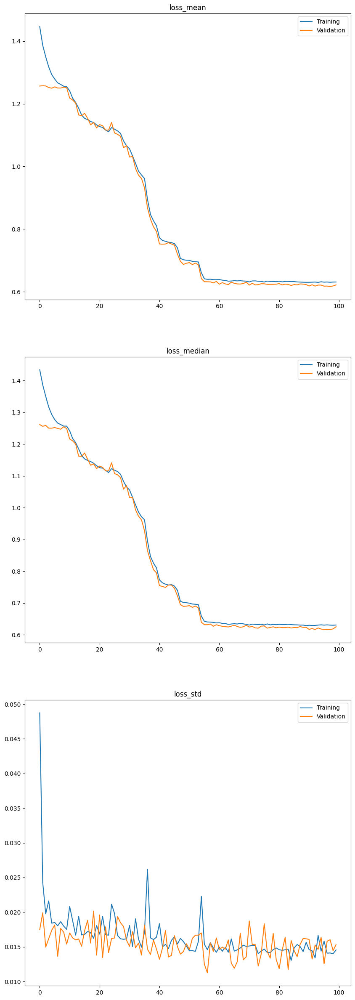

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=512, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (1): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (2): Linear_skip_block(
    

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoder(
  (condition_embedding_layer): MLP(
    (linear1): Linear_block(
      (fc): Linear(in_features=1, out_features=512, bias=True)
      (act): LeakyReLU(negative_slope=0.01)
      (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (drop): Dropout(p=0.1, inplace=False)
    )
    (hidden_layers): Sequential(
      (0): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (1): Linear_skip_block(
        (fc): Linear(in_features=512, out_features=512, bias=True)
        (act): LeakyReLU(negative_slope=0.01)
        (bn): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (drop): Dropout(p=0.1, inplace=False)
      )
      (2): Linear_skip_block(
    

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:07<00:00,  2.91it/s]


{'loss_mean': 0.6204703450202942,
 'loss_median': 0.6206737756729126,
 'loss_std': 0.013793201185762882}

In [ ]:
N_SAMPLES_PER_MODEL = 1_000

In [ ]:
full_model = ModelToPosteriorCNF(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//8,
    solve_adjoint = True,
    atol = 1e-4,
    rtol = 1e-4,
    #device = torch.device("cpu")
)
benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_logreg_program_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 0.5, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                p = torch.sigmoid(mean)

                y_dist = dist.Bernoulli(p).to_event(1)

                y = pyro.sample("obs", y_dist, obs=y)


                return {
                        "x": x,
                        "y": y,
                      

In [ ]:
trainer.test()

100%|██████████| 196/196 [01:07<00:00,  2.92it/s]


{'loss_mean': 0.6207677721977234,
 'loss_median': 0.6231040358543396,
 'loss_std': 0.015708696097135544}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:



hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
str(full_model)

'<PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF.ModelToPosteriorCNF object at 0x7b0db1596dd0>'

In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        #analytical_solution,
                        hmc_sampler,
                        vi_multivariate_normal,
                        vi_diag,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [ ]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:13<21:54, 13.27s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:26<21:19, 13.06s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:39<21:03, 13.03s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:52<21:07, 13.20s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:05<20:43, 13.09s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:18<20:39, 13.18s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:32<20:29, 13.22s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:45<20:10, 13.16s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:58<19:56, 13.14s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:11<19:42, 13.14s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:24<19:32, 13.17s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:37<19:21, 13.20s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:51<19:05, 13.16s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:04<18:55, 13.20s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:17<18:34, 13.11s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:30<18:20, 13.10s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:43<18:10, 13.14s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:56<17:58, 13.16s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:09<17:41, 13.10s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:22<17:26, 13.08s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:36<17:19, 13.16s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:48<17:00, 13.08s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:01<16:44, 13.04s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:15<16:32, 13.06s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:28<16:31, 13.22s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:41<16:15, 13.18s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:54<15:55, 13.09s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:07<15:44, 13.12s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:21<15:34, 13.16s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:34<15:17, 13.11s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:47<15:02, 13.08s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:00<14:54, 13.15s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:13<14:43, 13.19s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:27<14:40, 13.35s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:40<14:25, 13.32s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:53<14:11, 13.30s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:06<13:52, 13.21s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:19<13:33, 13.12s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:32<13:18, 13.09s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:45<13:04, 13.07s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:58<12:49, 13.05s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [09:12<12:42, 13.15s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:25<12:34, 13.24s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:38<12:16, 13.16s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:51<11:59, 13.08s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [10:04<11:50, 13.16s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:17<11:36, 13.13s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:30<11:18, 13.05s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:43<11:04, 13.03s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:57<10:55, 13.11s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [11:10<10:46, 13.19s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:23<10:32, 13.18s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:36<10:19, 13.19s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:49<10:06, 13.18s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [12:02<09:49, 13.11s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [12:16<09:41, 13.22s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:29<09:28, 13.21s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:42<09:12, 13.16s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:55<08:57, 13.11s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [13:09<08:51, 13.29s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:22<08:36, 13.23s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:35<08:22, 13.21s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:48<08:07, 13.17s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [14:01<07:54, 13.19s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [14:14<07:40, 13.15s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:27<07:25, 13.10s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:41<07:14, 13.17s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:54<07:03, 13.24s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [15:07<06:50, 13.25s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [15:21<06:36, 13.22s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:34<06:23, 13.24s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:47<06:08, 13.17s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [16:00<05:55, 13.16s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [16:13<05:43, 13.21s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [16:27<05:30, 13.20s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:40<05:15, 13.13s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:53<05:05, 13.28s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [17:06<04:52, 13.28s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [17:19<04:36, 13.17s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:32<04:21, 13.08s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:46<04:09, 13.15s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:58<03:55, 13.07s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [18:11<03:41, 13.04s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [18:25<03:29, 13.09s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:38<03:18, 13.25s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:52<03:05, 13.27s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [19:05<02:52, 13.23s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [19:18<02:38, 13.24s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [19:31<02:25, 13.21s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [19:44<02:12, 13.25s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:58<01:59, 13.26s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [20:11<01:46, 13.33s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [20:25<01:33, 13.38s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:38<01:20, 13.46s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:52<01:07, 13.48s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [21:05<00:53, 13.34s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [21:18<00:39, 13.30s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [21:31<00:26, 13.25s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [21:44<00:13, 13.25s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<18:07, 10.99s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:22<18:24, 11.27s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:33<18:16, 11.30s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:45<18:03, 11.29s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:56<17:47, 11.24s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:07<17:47, 11.35s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:18<17:29, 11.29s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:30<17:14, 11.25s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:41<16:58, 11.20s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:52<16:53, 11.26s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:03<16:36, 11.20s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:15<16:33, 11.29s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:26<16:23, 11.31s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:38<16:18, 11.37s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:49<16:00, 11.30s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:00<15:47, 11.27s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:11<15:33, 11.25s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:22<15:23, 11.27s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:34<15:11, 11.25s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:45<14:59, 11.24s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:56<14:53, 11.31s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:08<14:46, 11.37s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:19<14:32, 11.33s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:30<14:15, 11.25s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:42<14:08, 11.31s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:53<13:50, 11.22s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:04<13:34, 11.15s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:15<13:22, 11.15s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:26<13:17, 11.23s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:37<13:08, 11.26s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:49<13:04, 11.36s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:01<12:54, 11.40s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:12<12:48, 11.46s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:23<12:31, 11.39s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:34<12:15, 11.31s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:46<12:00, 11.26s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:57<11:52, 11.31s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [07:08<11:37, 11.25s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:19<11:24, 11.21s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:31<11:13, 11.22s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:42<11:11, 11.38s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:53<10:56, 11.32s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [08:04<10:39, 11.22s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [08:15<10:24, 11.15s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:27<10:19, 11.26s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:38<10:09, 11.28s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:49<09:56, 11.25s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [09:01<09:42, 11.20s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [09:12<09:35, 11.29s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:23<09:20, 11.22s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:34<09:08, 11.20s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:45<08:56, 11.18s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:57<08:49, 11.27s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [10:08<08:37, 11.26s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [10:19<08:26, 11.26s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:31<08:14, 11.25s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:42<08:05, 11.29s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:53<07:51, 11.23s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [11:04<07:37, 11.17s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [11:15<07:25, 11.14s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:27<07:20, 11.30s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:38<07:06, 11.23s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:49<06:55, 11.24s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [12:00<06:44, 11.23s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [12:12<06:34, 11.28s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [12:23<06:23, 11.29s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:34<06:09, 11.21s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:45<05:57, 11.18s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:57<05:50, 11.31s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [13:08<05:41, 11.37s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [13:20<05:28, 11.33s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [13:31<05:18, 11.39s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:42<05:06, 11.36s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:54<04:55, 11.36s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [14:05<04:42, 11.29s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [14:16<04:30, 11.29s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [14:27<04:18, 11.24s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [14:38<04:06, 11.19s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [14:50<03:56, 11.25s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [15:02<03:48, 11.43s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [15:13<03:36, 11.38s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [15:24<03:24, 11.34s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [15:35<03:12, 11.30s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [15:47<03:01, 11.32s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:58<02:48, 11.26s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [16:09<02:36, 11.17s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [16:20<02:25, 11.18s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [16:31<02:15, 11.28s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [16:43<02:04, 11.33s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [16:54<01:53, 11.31s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [17:05<01:41, 11.28s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [17:17<01:30, 11.32s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [17:28<01:18, 11.25s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [17:39<01:07, 11.21s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [17:50<00:55, 11.17s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [18:02<00:45, 11.27s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [18:13<00:33, 11.27s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [18:24<00:22, 11.29s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [18:36<00:11, 11.32s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<16:00,  9.70s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:55,  9.75s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:29<15:52,  9.82s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:39<15:53,  9.94s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:49<15:33,  9.83s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:58<15:16,  9.75s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:08<15:08,  9.77s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:18<15:06,  9.86s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:28<15:04,  9.94s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:38<14:47,  9.87s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:48<14:32,  9.80s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:57<14:25,  9.83s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:07<14:17,  9.86s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:17<14:07,  9.85s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:27<14:01,  9.90s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:37<13:50,  9.89s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:47<13:42,  9.91s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:57<13:36,  9.95s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:07<13:27,  9.96s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:17<13:24, 10.06s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:28<13:19, 10.12s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:37<12:58,  9.98s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:47<12:40,  9.88s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:57<12:30,  9.88s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:07<12:20,  9.87s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:17<12:15,  9.94s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:26<11:59,  9.85s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:36<11:50,  9.87s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:46<11:42,  9.89s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:57<11:42, 10.03s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:06<11:26,  9.95s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:16<11:16,  9.95s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:26<11:02,  9.89s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:36<10:58,  9.98s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:46<10:42,  9.88s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:56<10:28,  9.82s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:05<10:18,  9.82s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:16<10:15,  9.93s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:25<10:01,  9.86s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:35<09:51,  9.85s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:45<09:45,  9.92s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:55<09:40, 10.00s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:05<09:30, 10.01s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [07:15<09:14,  9.89s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:25<09:04,  9.91s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:35<08:54,  9.89s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:45<08:48,  9.97s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:55<08:34,  9.89s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:05<08:22,  9.85s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [08:15<08:17,  9.96s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:25<08:10, 10.01s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:35<08:01, 10.03s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:45<07:47,  9.94s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:55<07:36,  9.92s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [09:05<07:28,  9.98s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [09:14<07:15,  9.90s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:24<07:02,  9.83s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:34<06:54,  9.87s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:44<06:49,  9.98s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:54<06:39,  9.99s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [10:04<06:29,  9.98s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [10:14<06:17,  9.93s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [10:24<06:11, 10.04s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:34<05:59,  9.99s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:44<05:48,  9.97s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:54<05:35,  9.86s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [11:04<05:24,  9.84s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [11:14<05:19,  9.98s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [11:24<05:08,  9.96s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:33<04:56,  9.89s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:43<04:45,  9.84s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:54<04:39,  9.99s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [12:04<04:29, 10.00s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [12:13<04:19,  9.98s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [12:23<04:06,  9.87s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:33<03:59,  9.96s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:43<03:48,  9.94s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:53<03:37,  9.91s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [13:03<03:26,  9.85s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [13:13<03:17,  9.89s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [13:23<03:07,  9.88s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:33<02:58,  9.91s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:42<02:48,  9.92s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:53<02:39,  9.98s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [14:03<02:29,  9.96s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [14:12<02:19,  9.95s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [14:22<02:08,  9.90s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [14:32<01:58,  9.85s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:42<01:49,  9.93s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:52<01:39,  9.93s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [15:02<01:29,  9.92s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [15:12<01:19,  9.88s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [15:22<01:10, 10.07s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [15:32<01:00, 10.07s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:42<00:50, 10.03s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:52<00:39,  9.99s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [16:02<00:30, 10.03s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [16:12<00:19,  9.95s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [16:22<00:09,  9.93s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:14<24:30, 14.85s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:29<24:10, 14.80s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:44<23:54, 14.79s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:58<23:29, 14.69s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:13<23:08, 14.61s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:28<23:00, 14.69s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:42<22:39, 14.62s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:57<22:25, 14.63s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:12<22:19, 14.72s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:26<22:00, 14.67s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:41<21:50, 14.72s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:56<21:31, 14.67s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:10<21:11, 14.61s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:25<21:01, 14.67s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:40<20:43, 14.62s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:54<20:31, 14.66s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:09<20:22, 14.73s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:24<20:03, 14.67s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:38<19:43, 14.61s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:53<19:33, 14.67s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:08<19:19, 14.67s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:23<19:12, 14.78s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:38<18:59, 14.79s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:52<18:42, 14.77s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:07<18:31, 14.82s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:22<18:18, 14.85s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:37<17:56, 14.74s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:51<17:44, 14.79s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:06<17:22, 14.69s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:21<17:12, 14.75s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:36<17:04, 14.85s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:50<16:40, 14.72s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:05<16:26, 14.72s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:20<16:11, 14.72s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:35<15:58, 14.74s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:50<15:55, 14.94s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [09:05<15:44, 14.99s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [09:20<15:26, 14.94s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:35<15:14, 14.99s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:50<14:56, 14.95s/it]

....................


Sampling posterior:  41%|████      | 41/100 [10:05<14:48, 15.05s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [10:20<14:29, 14.99s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:35<14:14, 14.98s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:50<14:03, 15.06s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [11:05<13:44, 14.99s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [11:20<13:30, 15.01s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:35<13:21, 15.11s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:50<13:02, 15.04s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [12:06<12:55, 15.20s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [12:22<12:48, 15.38s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:36<12:24, 15.19s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:51<12:05, 15.12s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [13:07<11:52, 15.17s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [13:22<11:35, 15.12s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [13:37<11:20, 15.12s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:52<11:05, 15.13s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [14:07<10:54, 15.22s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [14:23<10:40, 15.25s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [14:38<10:23, 15.20s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:53<10:07, 15.18s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [15:08<09:53, 15.22s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [15:23<09:37, 15.18s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [15:39<09:22, 15.20s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:54<09:07, 15.20s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [16:09<08:49, 15.12s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [16:24<08:35, 15.15s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [16:39<08:15, 15.02s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:54<08:00, 15.01s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [17:09<07:47, 15.09s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [17:24<07:31, 15.05s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [17:39<07:14, 14.99s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [17:54<07:01, 15.06s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [18:09<06:47, 15.09s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [18:24<06:32, 15.10s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [18:39<06:16, 15.04s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [18:54<06:01, 15.07s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [19:10<05:48, 15.15s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [19:25<05:31, 15.08s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [19:40<05:16, 15.06s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [19:55<05:01, 15.10s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [20:10<04:45, 15.04s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [20:25<04:30, 15.02s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [20:40<04:17, 15.16s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [20:55<03:59, 14.99s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [21:10<03:45, 15.03s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [21:25<03:29, 14.98s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [21:40<03:14, 14.96s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [21:55<03:00, 15.02s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [22:10<02:45, 15.08s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [22:25<02:30, 15.03s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [22:40<02:15, 15.08s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [22:55<01:59, 15.00s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [23:10<01:45, 15.07s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [23:25<01:30, 15.02s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [23:40<01:15, 15.05s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [23:56<01:00, 15.21s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [24:11<00:45, 15.16s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [24:26<00:30, 15.16s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [24:41<00:15, 15.11s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<27:05, 16.42s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:33<27:37, 16.91s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:50<27:13, 16.84s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:07<27:01, 16.89s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:23<26:28, 16.72s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:40<26:22, 16.83s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:57<25:53, 16.71s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:14<25:48, 16.83s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:30<25:16, 16.67s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:47<25:10, 16.78s/it]

....................


Sampling posterior:  11%|█         | 11/100 [03:04<24:41, 16.65s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:20<24:11, 16.49s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:37<24:04, 16.60s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:54<23:56, 16.71s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:10<23:41, 16.72s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:27<23:18, 16.65s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:44<23:17, 16.83s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [05:01<22:51, 16.73s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:17<22:25, 16.61s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:34<22:17, 16.72s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:51<22:02, 16.73s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [06:07<21:45, 16.74s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:24<21:16, 16.58s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:41<21:09, 16.71s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:58<20:59, 16.79s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:14<20:30, 16.63s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:31<20:21, 16.73s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:47<19:59, 16.66s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [08:04<19:49, 16.75s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:21<19:31, 16.74s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:38<19:30, 16.96s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:55<19:01, 16.78s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [09:11<18:41, 16.74s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:28<18:19, 16.66s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:44<18:00, 16.62s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [10:01<17:46, 16.67s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:18<17:30, 16.67s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:35<17:15, 16.71s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:51<16:54, 16.64s/it]

....................


Sampling posterior:  40%|████      | 40/100 [11:08<16:37, 16.63s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:24<16:11, 16.47s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:40<15:54, 16.45s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:57<15:36, 16.43s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [12:13<15:14, 16.33s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:29<14:58, 16.34s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:45<14:41, 16.32s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [13:02<14:27, 16.37s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:18<14:08, 16.33s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:35<13:57, 16.42s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:51<13:37, 16.34s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [14:07<13:24, 16.42s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:24<13:03, 16.32s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:40<12:44, 16.27s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:56<12:34, 16.41s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [15:13<12:19, 16.43s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:29<12:04, 16.46s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:45<11:41, 16.31s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [16:02<11:27, 16.36s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:18<11:06, 16.25s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:34<10:49, 16.23s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:51<10:36, 16.33s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [17:07<10:19, 16.30s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:23<10:05, 16.37s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:40<09:46, 16.29s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:56<09:31, 16.33s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [18:13<09:18, 16.42s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:29<09:02, 16.45s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:45<08:42, 16.33s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [19:01<08:24, 16.28s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:18<08:11, 16.39s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:34<07:52, 16.31s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:51<07:44, 16.58s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [20:08<07:25, 16.52s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:24<07:10, 16.56s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:40<06:50, 16.43s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:57<06:33, 16.40s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [21:13<06:15, 16.31s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:29<06:00, 16.37s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:46<05:44, 16.40s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [22:02<05:27, 16.38s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [22:19<05:14, 16.54s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:35<04:54, 16.37s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:51<04:37, 16.35s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [23:08<04:21, 16.35s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:24<04:05, 16.37s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:41<03:49, 16.42s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:57<03:32, 16.36s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [24:14<03:17, 16.48s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:31<03:03, 16.68s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:47<02:46, 16.67s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [25:04<02:28, 16.49s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [25:20<02:11, 16.38s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:36<01:54, 16.40s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:52<01:37, 16.33s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [26:09<01:22, 16.42s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:25<01:05, 16.42s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:42<00:49, 16.42s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [26:58<00:32, 16.29s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [27:14<00:16, 16.30s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 638.67it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [06:40<00:00,  4.01s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,<PFNExperiments.LinearRegression.Models.ModelT...,gt,14.168926,0.062580,0.5278,-6.612519,0.395047,0.369613,0.004062,0.000212,0.032046,2.884483,0.097380,0.088820
1,Hamiltonian Monte Carlo,gt,14.182383,0.062313,0.5311,-4.564276,0.320107,0.304663,0.004827,0.000173,0.031914,2.096069,0.087260,0.085185
2,Variational Inference with guide: AutoMultivar...,gt,14.181342,0.062325,0.5226,-5.001129,0.322618,0.306232,0.004698,0.000172,0.035137,2.886895,0.090070,0.083636
3,Variational Inference with guide: AutoDiagonal...,gt,14.162716,0.062334,0.5251,-6.211111,0.316889,0.304342,0.002982,0.000128,0.039106,4.529861,0.088413,0.085601
4,Variational Inference with guide: AutoLaplaceA...,gt,14.133183,0.062414,0.5799,NaN,NaN,0.304083,0.000000,0.000000,0.030201,NaN,NaN,0.084890
5,Variational Inference with guide: AutoIAFNorma...,gt,14.182130,0.062339,0.5255,-4.796309,0.322579,0.304952,0.004461,0.000171,0.032392,2.233986,0.091064,0.083786
6,Variational Inference with guide: AutoStructur...,gt,14.182307,0.062318,0.5264,-4.846380,0.325184,0.304962,0.004199,0.000178,0.031415,2.431981,0.081382,0.085100


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,6.311606e-18,2.746622e-12,5.309052e-01,4.286371e-15,4.163329e-11,1.707900e-14
1,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,6.504111e-18,6.500622e-13,2.815372e-01,6.606663e-10,8.303582e-11,2.292085e-14
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,4.782480e-15,3.698170e-14,4.931745e-01,1.477808e-02,3.507382e-12,2.354050e-14
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,1.042768e-10,1.966415e-15,NaN,NaN,7.397715e-15
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,6.508133e-12,7.693086e-01,1.924885e-11,6.430413e-12,3.797352e-14
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,3.896560e-18,6.666875e-13,9.899505e-01,9.472455e-13,6.325120e-10,5.790255e-14
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,3.153830e-01,7.270966e-01,8.223348e-02,1.520507e-02,8.933277e-01,1.347393e-01
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,3.896560e-18,2.803045e-01,2.901715e-01,1.111921e-05,4.270481e-01,8.770384e-01
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,3.896560e-18,3.145405e-07,8.422501e-15,NaN,NaN,1.017052e-01
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,6.400620e-01,6.363770e-01,2.877023e-01,1.294432e-01,7.001690e-01,8.178060e-01



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,1.111176,0.452071,0.834870,0.114813,0.149961,0.053671
1,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,1.113168,0.465181,0.835665,0.115414,0.151834,0.052773
2,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,1.119527,0.671106,0.874935,0.112747,0.173378,0.027706
3,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,1.477569,2.713079,1.000000,0.085922,0.168119,0.000000
4,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,1.112249,0.460088,0.833570,0.113348,0.149189,0.053971
5,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,1.113118,0.459744,0.832745,0.115983,0.153939,0.055158
6,Hamiltonian Monte Carlo,Variational Inference with guide: AutoMultivar...,0.777691,0.018602,0.578750,0.019580,0.006105,0.018341
7,Hamiltonian Monte Carlo,Variational Inference with guide: AutoDiagonal...,0.779389,0.116126,0.732655,0.016363,0.027604,0.023464
8,Hamiltonian Monte Carlo,Variational Inference with guide: AutoLaplaceA...,1.229478,2.173006,1.000000,0.026336,0.012412,0.000000
9,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,0.773314,0.012039,0.549015,0.018085,0.004524,0.019073


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoMultivar...,8.728480e-01,5.567773e-01,9.619977e-01
1,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoDiagonal...,5.633576e-01,1.729603e-15,1.705654e-08
2,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoLaplaceA...,9.002574e-34,2.562144e-34,5.634628e-39
3,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoIAFNorma...,9.775832e-01,7.313757e-01,8.892318e-01
4,<PFNExperiments.LinearRegression.Models.ModelT...,Hamiltonian Monte Carlo,<PFNExperiments.LinearRegression.Models.ModelT...,Variational Inference with guide: AutoStructur...,9.542109e-01,7.815308e-01,8.354693e-01
...,...,...,...,...,...,...,...
100,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,2.562144e-34,2.562144e-34,5.631729e-39
101,Variational Inference with guide: AutoDiagonal...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,5.282048e-02,2.640284e-34,2.634789e-34
102,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoStructur...,3.883931e-02,6.184843e-03,1.000000e+00
103,Variational Inference with guide: AutoLaplaceA...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,2.562144e-34,2.562144e-34,5.632971e-39


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0  <PFNExperiments.LinearRegression.Models.ModelT...  gt   
  1                            Hamiltonian Monte Carlo  gt   
  2  Variational Inference with guide: AutoMultivar...  gt   
  3  Variational Inference with guide: AutoDiagonal...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          14.168926            0.062580   
  1                                          14.182383            0.062313   
  2                                          14.181342            0.062325   
  3                                          14.162716            0.062334   
  4                                          14.133183            0.0

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

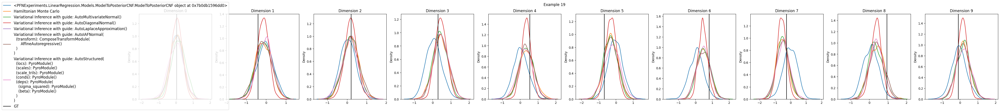

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

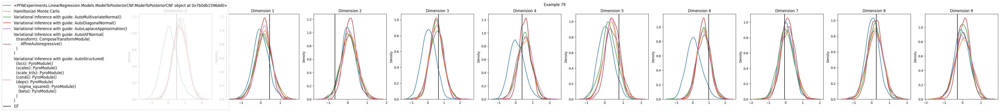

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

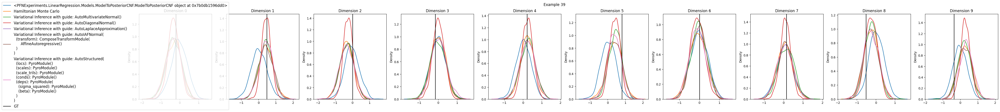

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

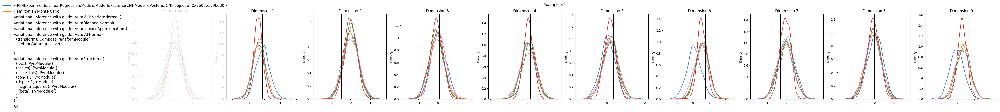

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

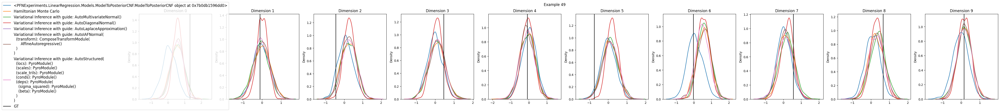

In [ ]:
evaluation.plot_results()